Author: **SRISAICHARAN VELISETTI**



# Edge detection  

## Overview
The main steps of edge detection are: (1) assign a score to each pixel; (2) find local maxima along the direction perpendicular to the edge. Sometimes a third step is performed where local evidence is propagated so that long contours are more confident or strong edges boost the confidence of nearby weak edges. Optionally, a thresholding step can then convert from soft boundaries to hard binary boundaries. Here are sample outputs.



**Hint:** Reading these papers will help understanding and may help with the programming.

[The design and use of steerable filters](http://people.csail.mit.edu/billf/papers/steerpaper91FreemanAdelson.pdf)

[Berkeley Pb Detector](https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/papers/mfm-pami-boundary.pdf)

[Multi-scale edge detection](https://home.ttic.edu/~xren/publication/xren_eccv08_multipb.pdf)

## Data
We have provided 50 test images and the codes associated to download the unzip the data. Your job is to build a simple gradient-based edge detector and to extend it using multiple oriented filters.

**WARNING: Colab deletes all files everytime runtime is disconnected. Make sure to re-download the inputs when it happens.**

In [ ]:
# Download Data -- run this cell only one time per runtime
!gdown 1zgblBWTQ847yZKnRmM1QrRiEWu1WvEo7
!unzip "/content/edge_detection_inputs.zip" -d "/content/"

In [127]:
# Import necessary packages
import numpy as np
import cv2
from google.colab.patches import cv2_imshow ## Use this to show image in colab


## Subpart 1: Simple edge detection (8 points)
Build a simple gradient-based edge detector that includes the following functions
```
def gradientMagnitude(im, signma)
```
This function should take an RGB image as input, smooth the image with Gaussian std=sigma, compute the x and y gradient values of the smoothed image, and output image maps of the gradient magnitude and orientation at each pixel. You can compute the gradient magnitude of an RGB image by taking the L2-norm of the R, G, and B gradients. The orientation can be computed from the channel corresponding to the largest gradient magnitude. The overall gradient magnitude is the L2-norm of the x and y gradients. mag and theta should be the same size as im.

```
def edgeGradient(im):
```
This function should use gradientMagnitude to compute a soft boundary map and then perform non-maxima suppression. For this assignment, it is acceptable to perform non-maxima suppression by retaining only the magnitudes along the binary edges produce by the Canny edge detector: `cv2.Canny(im)`. 

If desired, the boundary scores can be rescaled, e.g., by raising to an exponent: `mag2 = mag.^0.7` , which is primarily useful for visualization. 


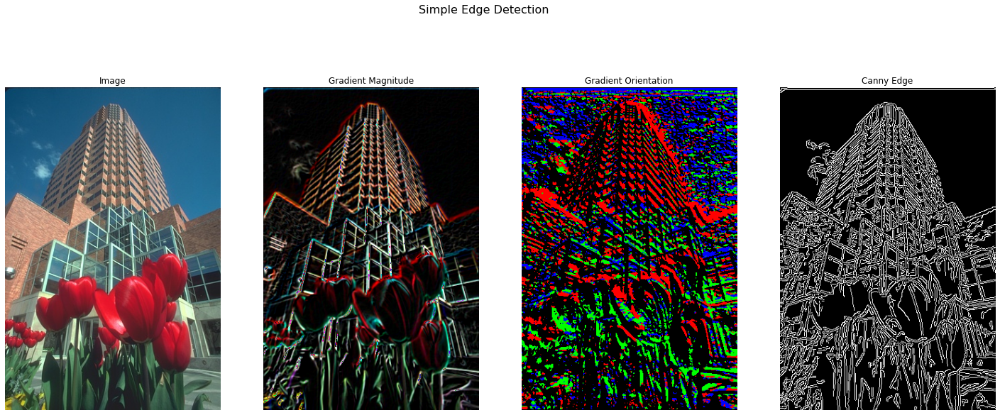

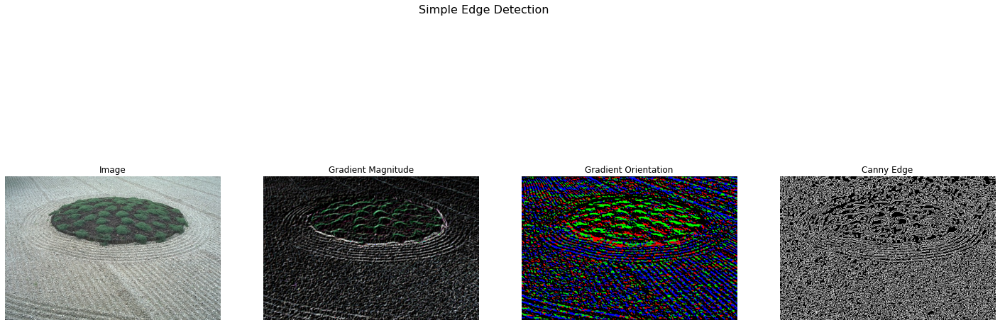

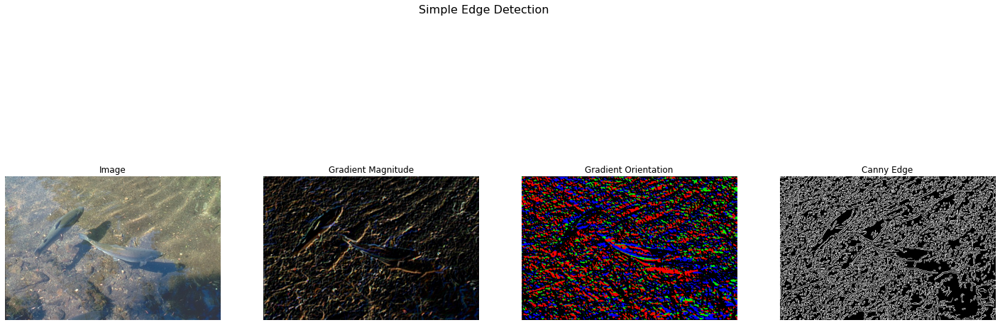

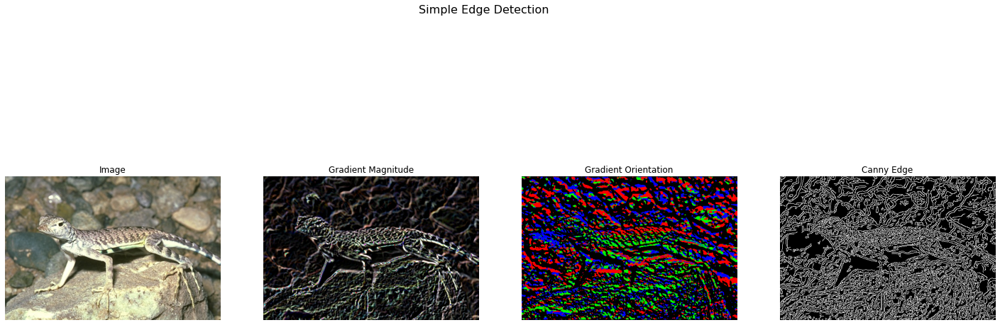

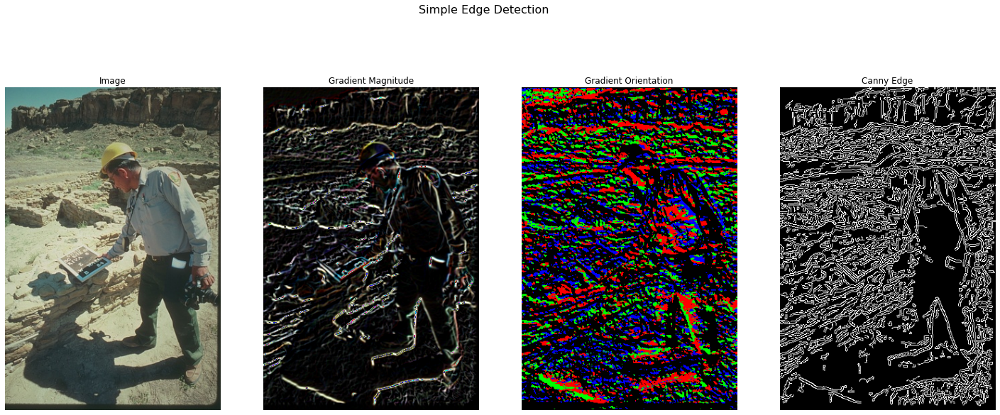

In [128]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt

def gradientMagnitude(im, sigma):
  '''
  im: input image
  sigma: standard deviation value to smooth the image

  outputs: gradient magnitude and gradient direction of the image
  '''
  im = cv2.GaussianBlur(im,(5,5),sigma)

  lap = cv2.Laplacian(im,cv2.CV_64F,ksize=3) 
  lap = np.uint8(np.absolute(lap))
  
  sobel_x= cv2.Sobel(im,0, dx=1,dy=0)
  sobel_x= np.uint8(np.absolute(sobel_x))
  
  sobel_y= cv2.Sobel(im,0, dx=0,dy=1)
  sobel_y = np.uint8(np.absolute(sobel_y))
  combined = sobel_x + sobel_y
  combined1 = combined/combined.max()*255
  g_orientation = np.zeros_like(im)
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      max_idx = np.argmax(combined[i,j,:])
      g_orientation[i,j,max_idx] = np.arctan2(sobel_y[i,j,max_idx], sobel_x[i,j,max_idx])
  g_orientation2 = g_orientation / g_orientation.max() * 255

  return combined,g_orientation, g_orientation2


def edgeGradient(im):
  '''
  im: input image

  output: a soft boundary map of the image
  '''
  
  img = cv2.Canny(im,50,150, L2gradient=True)
  return img
  
def simple_edge_detector(img):
  sigma = 1
  g_mag, g_orient, g_orient_norm  = gradientMagnitude(img,sigma)
  canny_img = edgeGradient(g_mag)
  fig, plot_arr = plt.subplots(1, 4,figsize=(25, 10))
  fig.suptitle('Simple Edge Detection', fontsize=16)
  plt.gcf().set_facecolor('white')
  plot_arr[0].imshow(cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR))
  plot_arr[0].set_title("Image")
  plot_arr[0].axis('off')
  plot_arr[1].imshow(cv2.cvtColor(g_mag.astype('uint8'), cv2.COLOR_RGB2BGR))
  plot_arr[1].set_title("Gradient Magnitude")
  plot_arr[1].axis('off')
  plot_arr[2].imshow(cv2.cvtColor(g_orient_norm.astype('uint8'), cv2.COLOR_RGB2BGR))
  plot_arr[2].set_title("Gradient Orientation")
  plot_arr[2].axis('off')
  plot_arr[3].imshow(canny_img, cmap='gray')
  plot_arr[3].set_title("Canny Edge")
  plot_arr[3].axis('off')


image_1 = cv2.imread("/content/edge_detection_inputs/86000.jpg")
simple_edge_detector(image_1)
image_2 = cv2.imread("/content/edge_detection_inputs/86016.jpg")
simple_edge_detector(image_2)
image_3 = cv2.imread("/content/edge_detection_inputs/86068.jpg")
simple_edge_detector(image_3)
image_4 = cv2.imread("/content/edge_detection_inputs/87046.jpg")
simple_edge_detector(image_4)
image_5 = cv2.imread("/content/edge_detection_inputs/89072.jpg")
simple_edge_detector(image_5)

## Subpart 2: Improved Edge Detection (8 points)
Try to improve your results using a set of oriented filters, rather than the simple derivative of Gaussian approach above, including the following functions:
```
def orientedFilterMagnitude(im):
```
Computes the boundary magnitude and orientation using a set of oriented filters, such as elongated Gaussian derivative filters. Explain your choice of filters in the write-up. Use at least four orientations. One way to combine filter responses is to compute a boundary score for each filter (simply by filtering with it) and then use the max and argmax over filter responses to compute the magnitude and orientation for each pixel.
```
def edgeOrientedFilters(im):
```
Similar to Subpart 1, this should call orientedFilterMagnitude, perform the non-maxima suppression, and output the final soft edge map.

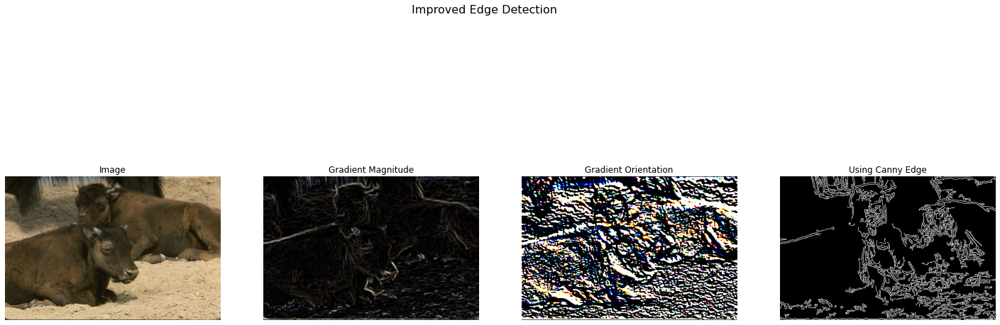

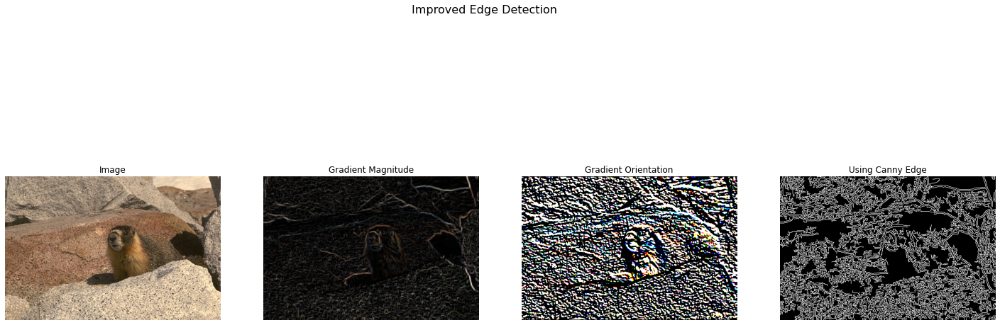

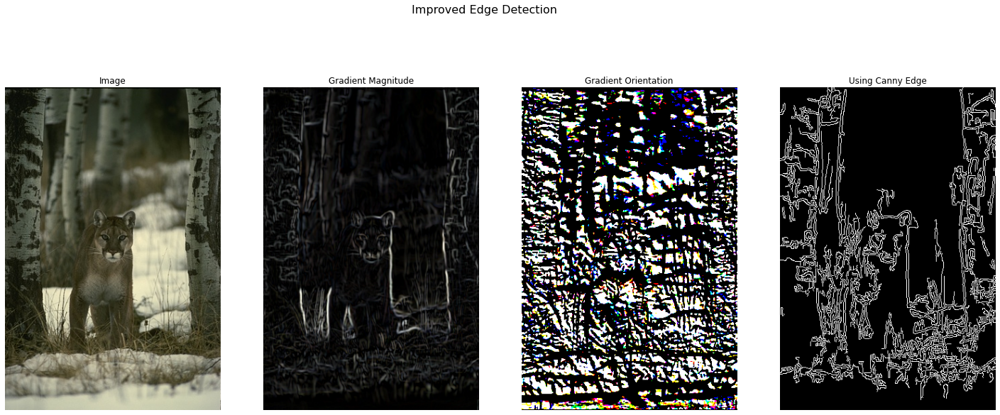

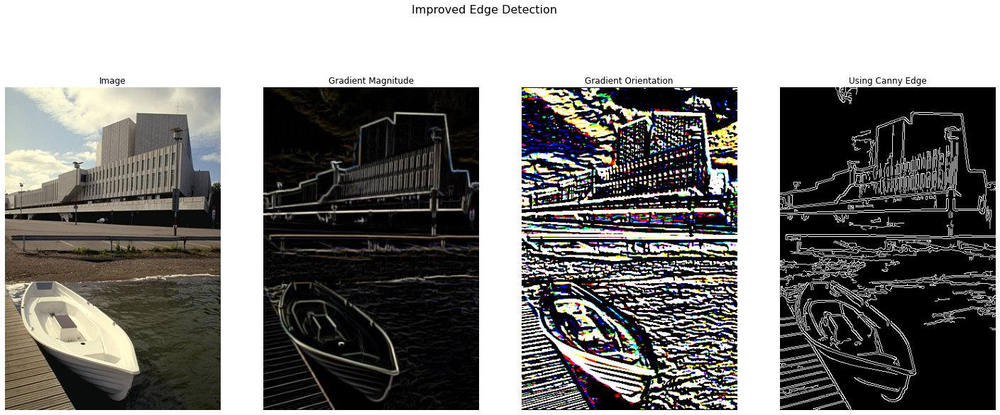

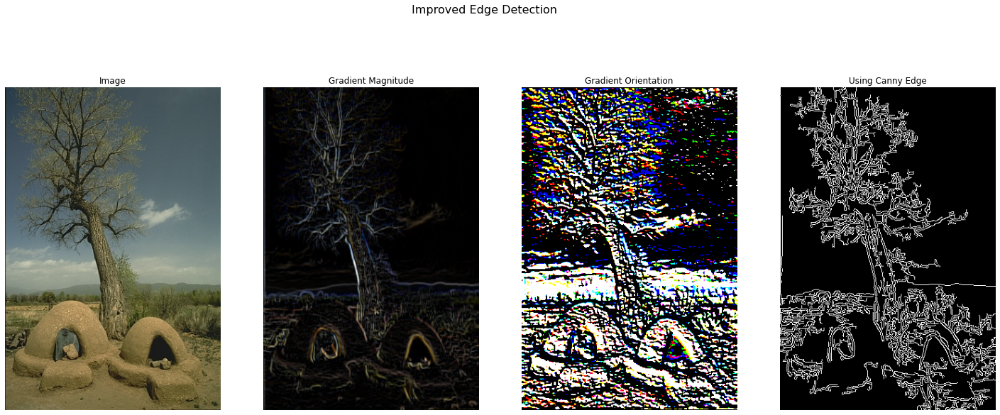

In [129]:
from IPython.core.interactiveshell import magic
# Import necessary packages
import numpy as np
import cv2
from google.colab.patches import cv2_imshow ## Use this to show image in colab


def orientedFilterMagnitude(im):
  gauss_1d = cv2.getGaussianKernel(5,1)
  gauss_2d = gauss_1d * gauss_1d.T
  sobel_x = np.array(([-1,0,1],[-2,0,2],[-1,0,1]))
  sobel_y = sobel_x.T
  do_gaussian_x =  cv2.filter2D(gauss_2d,-1,sobel_x)
  do_gaussian_y =  cv2.filter2D(gauss_2d,-1,sobel_y) 
  filter1 = do_gaussian_x * np.cos(np.deg2rad(0)) + do_gaussian_y*np.sin(np.deg2rad(0))
  filter2 = do_gaussian_x * np.cos(np.deg2rad(30)) + do_gaussian_y*np.sin(np.deg2rad(30))
  filter3 = do_gaussian_x * np.cos(np.deg2rad(60)) + do_gaussian_y*np.sin(np.deg2rad(60))
  filter4 = do_gaussian_x * np.cos(np.deg2rad(90)) + do_gaussian_y*np.sin(np.deg2rad(90))
  filter5 = do_gaussian_x * np.cos(np.deg2rad(120)) + do_gaussian_y*np.sin(np.deg2rad(120))
  filter6 = do_gaussian_x * np.cos(np.deg2rad(150)) + do_gaussian_y*np.sin(np.deg2rad(150))
  blur = cv2.GaussianBlur(im,(5,5),1)
  gradient_mag_1 = cv2.filter2D(blur,-1,filter1)
  gradient_mag_2 = cv2.filter2D(blur,-1,filter2)
  gradient_mag_3 = cv2.filter2D(blur,-1,filter3)
  gradient_mag_4 = cv2.filter2D(blur,-1,filter4)
  gradient_mag_5 = cv2.filter2D(blur,-1,filter5)
  gradient_mag_6 = cv2.filter2D(blur,-1,filter6)
  magnitued = np.zeros_like(im)
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      magnitued[i,j,0]= max(gradient_mag_1[i,j,0],gradient_mag_2[i,j,0],gradient_mag_3[i,j,0],gradient_mag_4[i,j,0],gradient_mag_5[i,j,0],gradient_mag_6[i,j,0])
      magnitued[i,j,1]= max(gradient_mag_1[i,j,1],gradient_mag_2[i,j,1],gradient_mag_3[i,j,1],gradient_mag_4[i,j,1],gradient_mag_5[i,j,1],gradient_mag_6[i,j,1])
      magnitued[i,j,2]= max(gradient_mag_1[i,j,2],gradient_mag_2[i,j,2],gradient_mag_3[i,j,2],gradient_mag_4[i,j,2],gradient_mag_5[i,j,2],gradient_mag_6[i,j,2])
  magnitued_2 = magnitued/magnitued.max()*255
  g_orientation = np.zeros_like(im)
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      g_orientation[i,j,:] = np.arctan2(gradient_mag_4[i,j,:], gradient_mag_1[i,j,:])
  g_orientation2 = g_orientation / g_orientation.max() * 255
  return magnitued,g_orientation,g_orientation2,magnitued_2

def edgeOrientedFilters(im):
  img_canny = cv2.Canny(im,5,150, L2gradient=True)
  return img_canny
  
def improved_edge(img):
  magnitued,g_orientation,g_orientation_norm,mag_norm = orientedFilterMagnitude(img)
  canny_img = edgeOrientedFilters(magnitued)
  fig, plot_arr = plt.subplots(1, 4,figsize=(25, 10))
  fig.suptitle('Improved Edge Detection', fontsize=16)
  plt.gcf().set_facecolor('white')
  plot_arr[0].imshow(cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR))
  plot_arr[0].set_title("Image")
  plot_arr[0].axis('off')
  plot_arr[1].imshow(cv2.cvtColor(mag_norm.astype('uint8'), cv2.COLOR_RGB2BGR))
  plot_arr[1].set_title("Gradient Magnitude")
  plot_arr[1].axis('off')
  plot_arr[2].imshow(cv2.cvtColor(g_orientation_norm.astype('uint8'), cv2.COLOR_RGB2BGR))
  plot_arr[2].set_title("Gradient Orientation")
  plot_arr[2].axis('off')
  plot_arr[3].imshow(canny_img, cmap='gray')
  plot_arr[3].set_title("Using Canny Edge")
  plot_arr[3].axis('off')

image_1 = cv2.imread("/content/edge_detection_inputs/41033.jpg")
improved_edge(image_1)
image_2 = cv2.imread("/content/edge_detection_inputs/41069.jpg")
improved_edge(image_2)
image_3 = cv2.imread("/content/edge_detection_inputs/42012.jpg")
improved_edge(image_3)
image_4 = cv2.imread("/content/edge_detection_inputs/78004.jpg")
improved_edge(image_4)
image_5 = cv2.imread("/content/edge_detection_inputs/54082.jpg")
improved_edge(image_5)

(-0.5, 4.5, 4.5, -0.5)

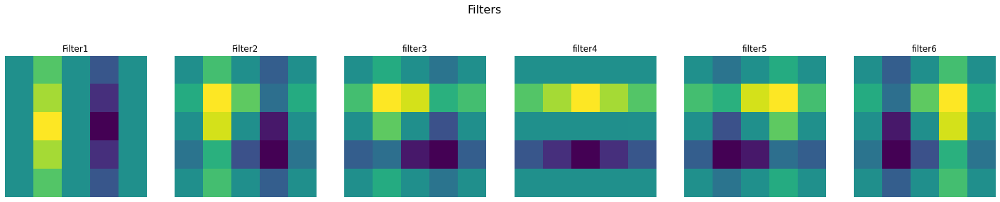

In [130]:
# Import necessary packages
import numpy as np
import cv2
from google.colab.patches import cv2_imshow ## Use this to show image in colab
import matplotlib.pyplot as plt

gauss_1d = cv2.getGaussianKernel(5,1)
gauss_2d = gauss_1d * gauss_1d.T
sobel_x = np.array(([-1,0,1],[-2,0,2],[-1,0,1]))
sobel_y = sobel_x.T
do_gaussian_x =  cv2.filter2D(gauss_2d,-1,sobel_x) # derivative of gaussian along x direction
do_gaussian_y =  cv2.filter2D(gauss_2d,-1,sobel_y)
filter1 = do_gaussian_x * np.cos(np.deg2rad(0)) + do_gaussian_y*np.sin(np.deg2rad(0))
filter2 = do_gaussian_x * np.cos(np.deg2rad(30)) + do_gaussian_y*np.sin(np.deg2rad(30))
filter3 = do_gaussian_x * np.cos(np.deg2rad(60)) + do_gaussian_y*np.sin(np.deg2rad(60))
filter4 = do_gaussian_x * np.cos(np.deg2rad(90)) + do_gaussian_y*np.sin(np.deg2rad(90))
filter5 = do_gaussian_x * np.cos(np.deg2rad(120)) + do_gaussian_y*np.sin(np.deg2rad(120))
filter6 = do_gaussian_x * np.cos(np.deg2rad(150)) + do_gaussian_y*np.sin(np.deg2rad(150))

fig, plot_arr = plt.subplots(1, 6,figsize=(25, 5))
fig.suptitle('Filters', fontsize=16)
plt.gcf().set_facecolor('white')
plot_arr[0].imshow(filter1)
plot_arr[0].set_title("Filter1")
plot_arr[0].axis('off')
plot_arr[1].imshow(filter2)
plot_arr[1].set_title("Filter2")
plot_arr[1].axis('off')
plot_arr[2].imshow(filter3)
plot_arr[2].set_title("filter3")
plot_arr[2].axis('off')
plot_arr[3].imshow(filter4)
plot_arr[3].set_title("filter4")
plot_arr[3].axis('off')
plot_arr[4].imshow(filter5)
plot_arr[4].set_title("filter5")
plot_arr[4].axis('off')
plot_arr[5].imshow(filter6)
plot_arr[5].set_title("filter6")
plot_arr[5].axis('off')